# Визуализация работы сетей с Deconvolution в развертке

## Загрузка датасета (картинки из коллекций, которых не было в обучении)

In [1]:
import h5py
import numpy as np

In [2]:
data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_collections.hdf5', 'r')
rgbs = data_file['data']
depths = data_file['label']
print(rgbs.shape, depths.shape)

(3821, 384, 512, 3) (3821, 384, 512)


In [3]:
rgbs_sample_for_score = np.array(rgbs)
depths_sample_for_score = np.array(depths)

In [4]:
data_file_scene = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_scenes.hdf5', 'r')
rgbs_scene = data_file_scene['data']
depths_scene = data_file_scene['label']

In [5]:
print(rgbs_scene.shape, depths_scene.shape)

(14266, 384, 512, 3) (14266, 384, 512)


In [6]:
rgbs_scene_sample_for_score = np.array(rgbs_scene[::5])
depths_scene_sample_for_score = np.array(depths_scene[::5])

## Загрузка моделей и оценка качества

In [7]:
from keras.models import load_model
model_5x5 = load_model('/home/kmouraviev/FCRN_notebooks/train_resnet_with_deconvolution_part4/model_on_epoch20.hdf5')
model_3x3 = load_model('/home/kmouraviev/FCRN_notebooks/train_resnet_with_deconvolution3x3_attempt2_part4/model_on_epoch22.hdf5')

Using TensorFlow backend.


### Оценка качества на неизвестных коллекциях

In [8]:
model_5x5_prediction = model_5x5.predict(rgbs_sample_for_score, batch_size=32)
model_3x3_prediction = model_3x3.predict(rgbs_sample_for_score, batch_size=32)

In [9]:
print('MSE of full-depth model in different collections:', \
      np.mean((model_5x5_prediction - depths_sample_for_score) ** 2))
print('MSE of truncated model in different collections:', \
      np.mean((model_3x3_prediction - depths_sample_for_score) ** 2))

MSE of full-depth model in different collections: 0.7746357176604018
MSE of truncated model in different collections: 0.7220653340775242


### Оценка качества на неизвестных сценах

In [10]:
model_5x5_prediction = model_5x5.predict(rgbs_scene_sample_for_score, batch_size=32)
model_3x3_prediction = model_3x3.predict(rgbs_scene_sample_for_score, batch_size=32)

In [11]:
print('MSE of full-depth model:', np.mean((model_5x5_prediction - depths_scene_sample_for_score) ** 2))
print('MSE of truncated model:', np.mean((model_3x3_prediction - depths_scene_sample_for_score) ** 2))

MSE of full-depth model: 0.6140305525464261
MSE of truncated model: 0.6199989942105442


## Визуализация работы моделей

### Визуализация работы на незивестных коллекциях

In [12]:
import matplotlib.pyplot as plt

In [13]:
def unpreprocess(image):
    img_min = -123
    img_max = 151
    return (image - img_min) / (img_max - img_min)

In [14]:
rgbs_sample_for_watch = rgbs_sample_for_score[::200]
depths_sample_for_watch = depths_sample_for_score[::200]

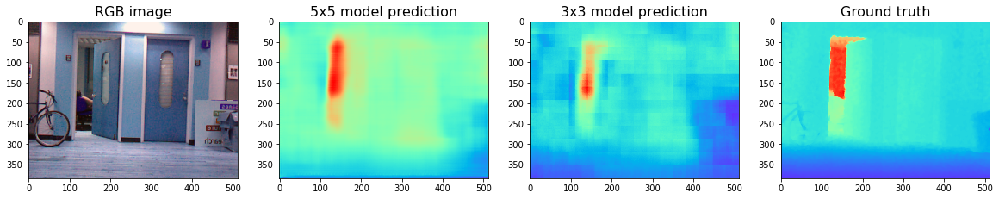

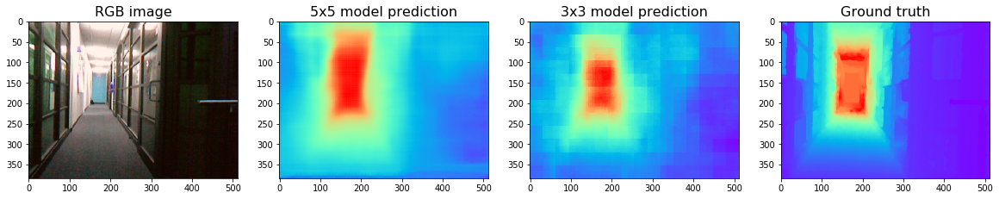

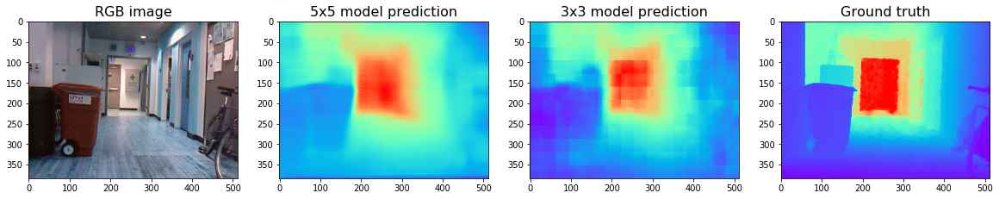

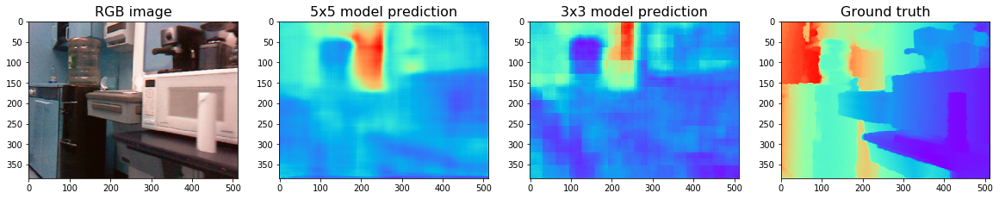

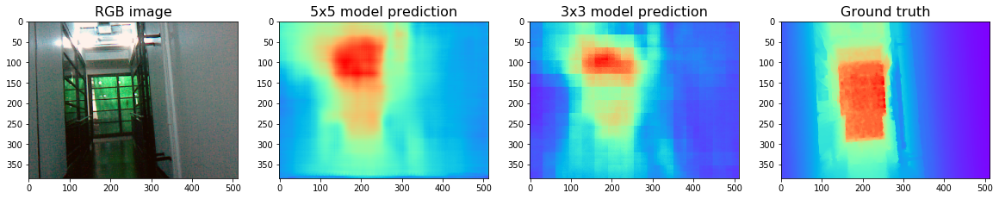

...

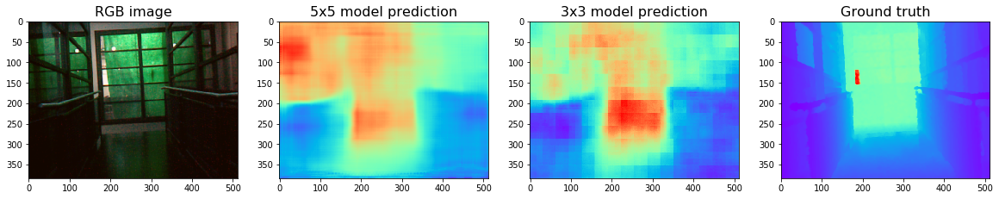

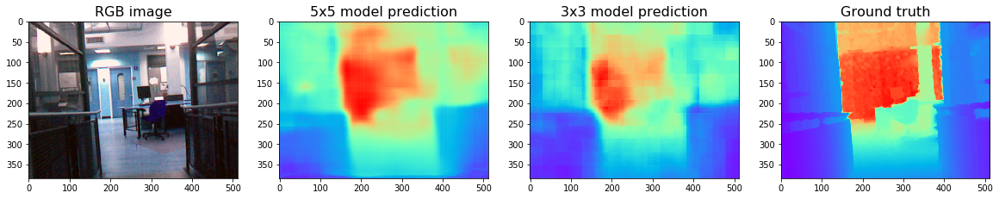

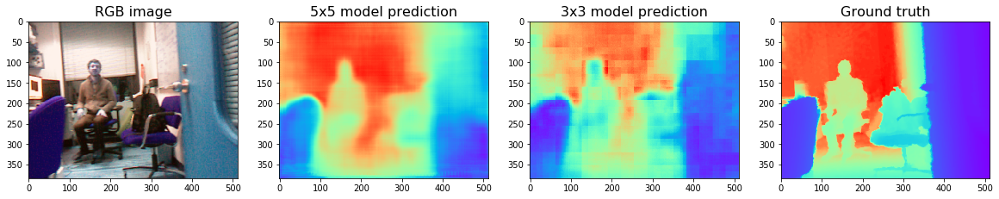

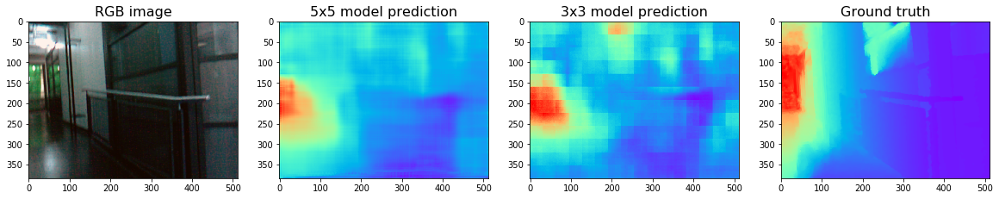

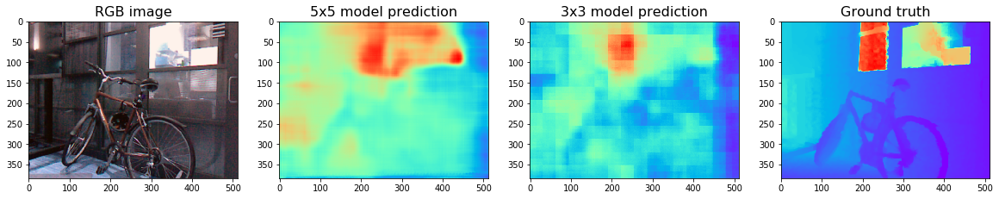

In [18]:
for rgb_image, depth_image in zip(rgbs_sample_for_watch, depths_sample_for_watch):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 4, 1)
    plt.title('RGB image', fontsize=16)
    plt.imshow(unpreprocess(rgb_image))
    plt.subplot(1, 4, 2)
    plt.title('5x5 model prediction', fontsize=16)
    model_5x5_prediction = model_5x5.predict(rgb_image[np.newaxis, ...])
    plt.imshow(model_5x5_prediction[0] / 10, cmap='rainbow')
    plt.subplot(1, 4, 3)
    plt.title('3x3 model prediction', fontsize=16)
    model_3x3_prediction = model_3x3.predict(rgb_image[np.newaxis, ...])
    plt.imshow(unpreprocess(model_3x3_prediction[0]) / 10, cmap='rainbow')
    plt.subplot(1, 4, 4)
    plt.title('Ground truth', fontsize=16)
    plt.imshow(depth_image / 10, cmap='rainbow')

### Визуализация изображений на неизвестных сценах

In [19]:
rgbs_scene_sample_for_watch = rgbs_scene_sample_for_score[134::235]
depths_scene_sample_for_watch = depths_scene_sample_for_score[134::235]

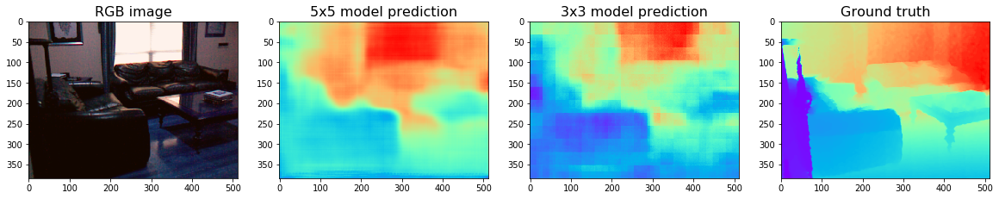

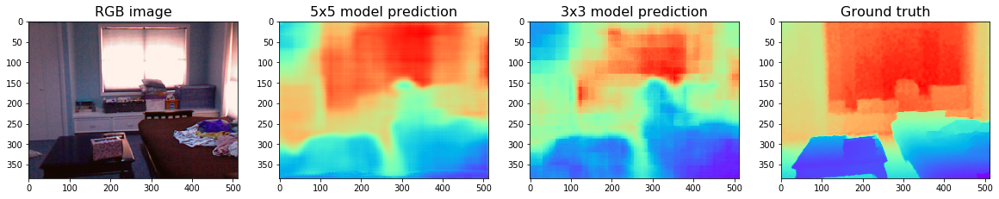

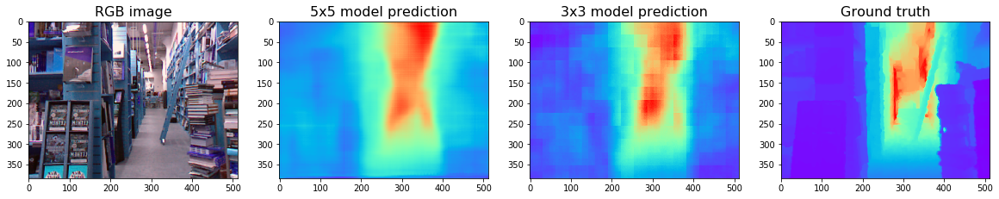

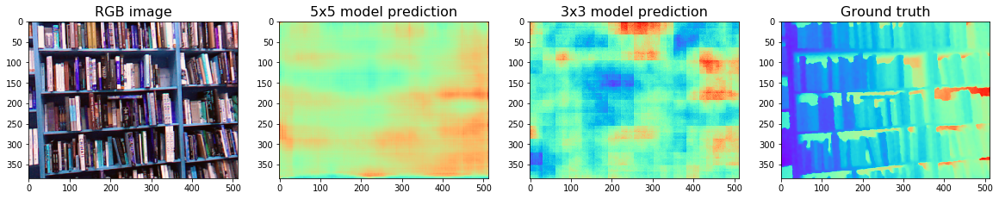

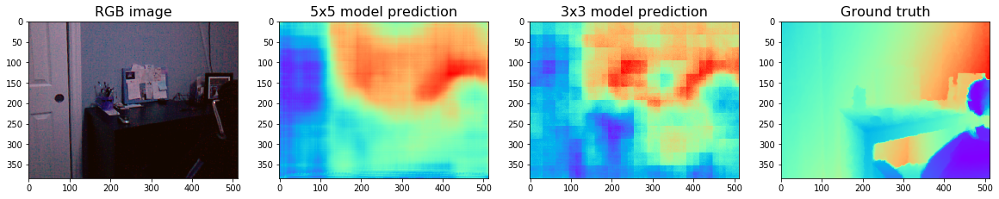

...

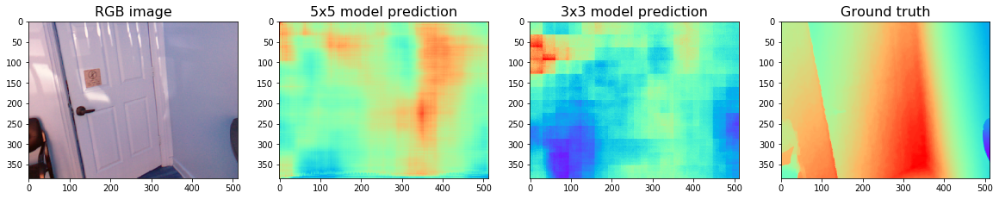

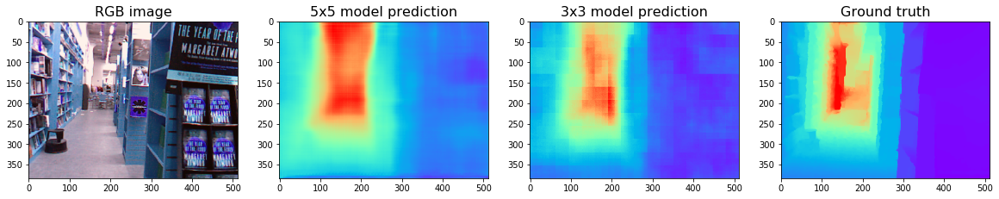

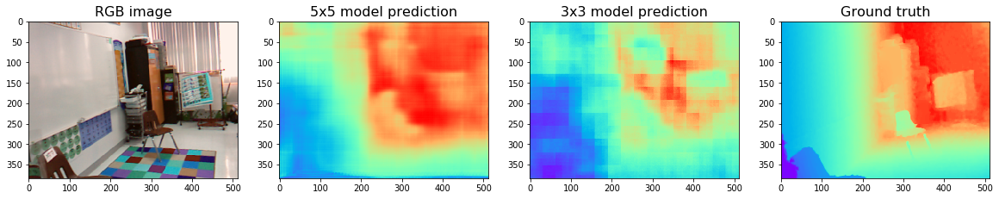

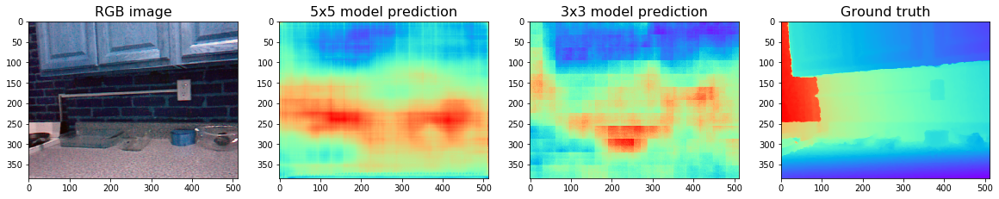

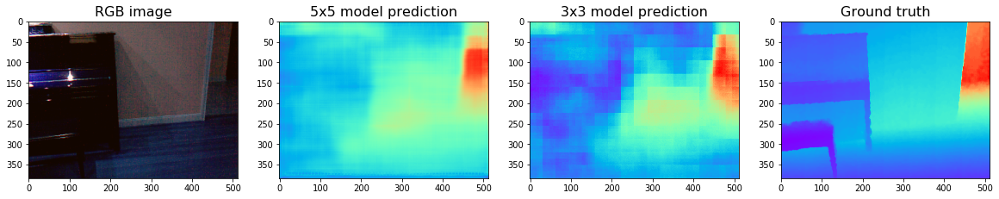

In [20]:
for rgb_image, depth_image in zip(rgbs_scene_sample_for_watch, depths_scene_sample_for_watch):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 4, 1)
    plt.title('RGB image', fontsize=16)
    plt.imshow(unpreprocess(rgb_image))
    plt.subplot(1, 4, 2)
    plt.title('5x5 model prediction', fontsize=16)
    model_5x5_prediction = model_5x5.predict(rgb_image[np.newaxis, ...])
    plt.imshow(model_5x5_prediction[0] / 10, cmap='rainbow')
    plt.subplot(1, 4, 3)
    plt.title('3x3 model prediction', fontsize=16)
    model_3x3_prediction = model_3x3.predict(rgb_image[np.newaxis, ...])
    plt.imshow(model_3x3_prediction[0] / 10, cmap='rainbow')
    plt.subplot(1, 4, 4)
    plt.title('Ground truth', fontsize=16)
    plt.imshow(depth_image / 10, cmap='rainbow')